<a href="https://colab.research.google.com/github/ishathombre/ASBA/blob/main/ABSA_deBERTa.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Imports

In [1]:
!pip install transformers datasets evaluate peft sentencepiece accelerate torch torchvision --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 510.5/510.5 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.1/199.1 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.4/297.4 kB 13.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 9.1 MB/s eta 0:00:00


In [3]:
import pandas as pd
import numpy as np

import xml.etree.ElementTree as ET
from xml.dom import minidom

from transformers import BertTokenizer, BertForSequenceClassification, AdamW, AutoTokenizer
from transformers import RobertaTokenizer, RobertaModel, RobertaForSequenceClassification
from transformers import DebertaForSequenceClassification, DebertaConfig, DebertaTokenizer, get_scheduler
from transformers import TrainingArguments, Trainer, TrainerCallback

from sklearn.model_selection import train_test_split
from datasets import Dataset
import torch
import torch.nn as nn

from sklearn.metrics import accuracy_score
import evaluate
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader

##Data download, parsing and inspection

Datasets downloaded from https://alt.qcri.org/semeval2014/task4/ Semeval2014 Task 4 (ABSA).

We first clone our repository with all the data and the scripts.

In [4]:
!git clone https://github.com/ishathombre/ASBA.git

Cloning into 'ASBA'...
remote: Enumerating objects: 129, done.
remote: Counting objects: 100% (8/8), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 129 (delta 3), reused 0 (delta 0), pack-reused 121
Receiving objects: 100% (129/129), 1.40 MiB | 3.39 MiB/s, done.
Resolving deltas: 100% (55/55), done.


In [5]:
%cd ASBA
xml_rest = 'Datasets/Restaurants_Train_v2.xml'
xml_lapt = 'Datasets/Laptop_Train_v2.xml'
from main import *

/content/ASBA


We parse the xml data and covert them in dataframes

In [6]:
import pandas as pd
import xml.etree.ElementTree as ET

def xml_to_df(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    data = []
    for sentence in root.findall('sentence'):
        sentence_id = sentence.get('id')
        text = sentence.find('text').text

        aspect_terms = sentence.find('aspectTerms')
        if aspect_terms is not None:
            for aspect_term in aspect_terms.findall('aspectTerm'):
                term = aspect_term.get('term')
                polarity = aspect_term.get('polarity')
                from_index = aspect_term.get('from')
                to_index = aspect_term.get('to')
                data.append([sentence_id, text, term, polarity, from_index, to_index])
        else:
            data.append([sentence_id, text, None, None, None, None])

    df = pd.DataFrame(data, columns=['sentence_id', 'text', 'term', 'polarity', 'from_index', 'to_index'])
    return df

#OR

def parse_data_2014(xml_file):
    container = []  # Initialize Container (List) for Parse Data
    sentences = ET.parse(xml_file).getroot()  # Get Sentence-Level Nodes

    for sentence in sentences:  # Loop Through Sentences
        sentence_id = sentence.attrib["id"]  # Save ID
        sentence_text = sentence.find('text').text  # Save Text
        aspects = sentence.findall('*')  # Get Aspect-Level Nodes

        found_category = False

        for aspect in aspects:  # Loop Through Aspects
            if aspect.tag == "aspectCategories":
                opinions = aspect.findall('*')  # Get Opinion-Level Nodes
                for opinion in opinions:
                    category = opinion.attrib["category"]
                    polarity = opinion.attrib.get("polarity", np.nan)
                    row = {"sentence_id": sentence_id, "sentence": sentence_text, "category": category, "polarity": polarity}
                    container.append(row)
                found_category = True

        if not found_category:
            row = {"sentence_id": sentence_id, "sentence": sentence_text, "category": np.nan, "polarity": np.nan}
            container.append(row)

    return pd.DataFrame(container)

In [7]:
# now we convert the xml to df
rests = parse_data_2014(xml_rest)
lapts = xml_to_df(xml_lapt)
#df = pd.concat([rests, lapts], ignore_index=True)

In [ ]:
# Data Inspection
rests['polarity'].value_counts()

polarity
positive    2179
negative     839
neutral      500
conflict     195
Name: count, dtype: int64

In [ ]:
lapts['polarity'].value_counts()

polarity
positive    987
negative    866
neutral     460
conflict     45
Name: count, dtype: int64

In [ ]:
rests['category'].value_counts()

category
food                       1232
anecdotes/miscellaneous    1132
service                     597
ambience                    431
price                       321
Name: count, dtype: int64

In [ ]:
lapts['term'].value_counts()

term
screen            58
price             55
use               53
battery life      52
battery           45
                  ..
OpenOffice         1
PRODUCT KEY        1
one touch keys     1
Delivery           1
stability          1
Name: count, Length: 1042, dtype: int64

We see that we have a lot of terms/aspects in both the datasets, however just few aspects have an high frequency and to simplify the classification we will focus on those ones, namely: 'service', 'food','anecdotes/miscellaneous','price', 'ambience'.

In [ ]:
rests.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3713 entries, 0 to 3712
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   sentence_id  3713 non-null   object
 1   sentence     3713 non-null   object
 2   category     3713 non-null   object
 3   polarity     3713 non-null   object
dtypes: object(4)
memory usage: 116.2+ KB


In [8]:
# resulting DF
df = rests
todrop=['sentence_id']
df.drop(columns=todrop, inplace=True)
df.head(10)

,sentence,category,polarity
0,But the staff was so horrible to us.,service,negative
1,"To be completely fair, the only redeeming fact...",food,positive
2,"To be completely fair, the only redeeming fact...",anecdotes/miscellaneous,negative
3,"The food is uniformly exceptional, with a very...",food,positive
4,Where Gabriela personaly greets you and recomm...,service,positive
5,"For those that go once and don't enjoy it, all...",anecdotes/miscellaneous,positive
6,"Not only was the food outstanding, but the lit...",food,positive
7,"Not only was the food outstanding, but the lit...",service,positive
8,It is very overpriced and not very tasty.,food,negative
9,It is very overpriced and not very tasty.,price,negative


##Dataset tokenization and encoding

In [9]:
# Define the class to encode dataset and function to slpit the dataset in train, val and test

class ABSA_Dataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.labels)

def merge_sent(list1, list2):
    merged_ = []
    for x, y in zip(list1, list2):
        merged_.append(x + " [SEP] " + str(y))
    return merged_

def split_dataframe(df, train_percent=0.7, val_percent=0.15, test_percent=0.15):

    if train_percent + val_percent + test_percent != 1.0:
        raise ValueError("The sum of train_percent, val_percent, and test_percent must be equal to 1.0.")

    # Shuffle the DataFrame
    df = df.sample(frac=1).reset_index(drop=True)

    # Calculate split indices
    total_samples = len(df)
    train_end = int(train_percent * total_samples)
    val_end = train_end + int(val_percent * total_samples)

    # Split the DataFrame
    train_df = df.iloc[:train_end]
    val_df = df.iloc[train_end:val_end]
    test_df = df.iloc[val_end:]

    return train_df, val_df, test_df


def setup_data(parsed_data, tokenizer, train_split, eval_split, test_split):

    # Shuffle the DataFrame
    df = parsed_data
    df = df.sample(frac=1).reset_index(drop=True)

    # Calculate split indices
    total_samples = len(df)
    train_end = int(train_split * total_samples)
    val_end = train_end + int(eval_split * total_samples)

    # Split the DataFrame
    train_df = df.iloc[:train_end]
    eval_df = df.iloc[train_end:val_end]
    test_df = df.iloc[val_end:]

    label_map = {'negative': 0, 'neutral': 1, 'positive': 2, 'conflict': 3}
    label_map_category = {'service': 4, 'food': 5,'anecdotes/miscellaneous': 6,'price': 7, 'ambience': 8 }

    train_texts = train_df['sentence']
    train_labels = train_df['polarity']
    train_labels_category = train_df['category']
    train_labels = [label_map[label_] for label_ in train_labels]
    train_labels_category = [label_map_category[label] for label in train_labels_category]


    eval_texts = eval_df['sentence']
    eval_labels = eval_df['polarity']
    eval_labels_category = eval_df['category']
    eval_labels = [label_map[label_] for label_ in eval_labels]
    eval_labels_category = [label_map_category[label] for label in eval_labels_category]

    test_texts = test_df['sentence']
    test_labels = test_df['polarity']
    test_labels_category = test_df['category']
    test_labels = [label_map[label_] for label_ in eval_labels]
    test_labels_category = [label_map_category[label] for label in eval_labels_category]

    train_encodings = tokenizer(train_texts, padding="max_length", truncation=True, max_length=512)
    eval_encodings = tokenizer(eval_texts, padding="max_length", truncation=True, max_length=512)
    test_encodings = tokenizer(test_texts, padding="max_length", truncation=True, max_length=512)

    train_labels = [train_labels, train_labels_category]
    eval_labels = [eval_labels, eval_labels_category]

    train_dataset = ABSA_Dataset(train_encodings, train_labels)
    val_dataset = ABSA_Dataset(eval_encodings, eval_labels)
    test_dataset = ABSA_Dataset(test_encodings, test_labels_category)

    return train_dataset, val_dataset, test_dataset


In [ ]:
# from matplotlib import pyplot as plt
# df_train['polarity'].plot(kind='hist', bins=20, title='polarity')
# plt.gca().spines[['top', 'right',]].set_visible(False)

In [10]:
# encoding data for training (explicited code)

tokenizer = DebertaTokenizer.from_pretrained("microsoft/deberta-base")
train_df, eval_df, test_df = split_dataframe(df, train_percent=0.7, val_percent=0.15, test_percent=0.15)

label_map = {'negative': 0, 'neutral': 1, 'positive': 2, 'conflict': 3}
label_map_category = {'service': 4, 'food': 5,'anecdotes/miscellaneous': 6,'price': 7, 'ambience': 8 }

train_texts = train_df['sentence']
train_labels = train_df['polarity']
train_labels_category = train_df['category']
train_labels = [label_map[label_] for label_ in train_labels]
train_labels_category = [label_map_category[label] for label in train_labels_category]


eval_texts = eval_df['sentence']
eval_labels = eval_df['polarity']
eval_labels_category = eval_df['category']
eval_labels = [label_map[label_] for label_ in eval_labels]
eval_labels_category = [label_map_category[label] for label in eval_labels_category]

test_texts = test_df['sentence']
test_labels = test_df['polarity']
test_labels_category = test_df['category']
test_labels = [label_map[label_] for label_ in test_labels]
test_labels_category = [label_map_category[label] for label in test_labels_category]

# Since DeBERTa does not accept 2 labels as input, I'm including the categories in the text embeddings
# separated by a special tokens [SEP]
train_ = merge_sent(train_texts, train_labels_category)
eval_ = merge_sent(eval_texts, eval_labels_category)
test_ = merge_sent(test_texts, test_labels_category)

# train_encodings = tokenizer(str(train_texts), padding="max_length", truncation=True, max_length=512)
# eval_encodings = tokenizer(str(eval_texts), padding="max_length", truncation=True, max_length=512)
# test_encodings = tokenizer(str(test_texts), padding="max_length", truncation=True, max_length=512)

train_encodings = tokenizer(train_, padding="max_length", truncation=True, max_length=512)
eval_encodings = tokenizer(eval_, padding="max_length", truncation=True, max_length=512)
test_encodings = tokenizer(test_, padding="max_length", truncation=True, max_length=512)

#train_labels = [train_labels, train_labels_category]
#eval_labels = [eval_labels, eval_labels_category]

train_dataset = ABSA_Dataset(train_encodings, train_labels)
val_dataset = ABSA_Dataset(eval_encodings, eval_labels)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/52.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/474 [00:00<?, ?B/s]

Make encodings  of text sequences and labels to feed the model.

In [ ]:
train_dataset.encodings

{'input_ids': [[1, 133, 689, 16, 10964, 8, 16467, 2460, 552, 19, 5, 5192, 8, 621, 868, 544, 4, 1437, 2, 195, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [ ]:
train_dataset.labels

[2,
 0,
 2,
 2,
 0,
 3,
 2,
 3,
 0,
 1,
 0,
 2,
 2,
 0,
 3,
 2,
 2,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 0,
 2,
 2,
 2,
 1,
 0,
 2,
 0,
 2,
 2,
 0,
 3,
 1,
 2,
 2,
 2,
 2,
 2,
 0,
 0,
 2,
 2,
 2,
 2,
 0,
 2,
 0,
 2,
 2,
 2,
 1,
 2,
 1,
 2,
 2,
 1,
 1,
 2,
 0,
 1,
 2,
 0,
 1,
 2,
 1,
 2,
 2,
 2,
 3,
 0,
 0,
 2,
 0,
 2,
 0,
 3,
 0,
 1,
 0,
 2,
 2,
 2,
 2,
 1,
 0,
 2,
 2,
 2,
 1,
 0,
 1,
 2,
 2,
 2,
 2,
 1,
 2,
 0,
 1,
 2,
 1,
 0,
 3,
 0,
 2,
 0,
 2,
 2,
 0,
 2,
 2,
 2,
 1,
 2,
 2,
 3,
 2,
 2,
 1,
 0,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 0,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 1,
 0,
 3,
 2,
 2,
 0,
 2,
 2,
 2,
 0,
 0,
 1,
 0,
 0,
 1,
 2,
 0,
 1,
 2,
 1,
 3,
 2,
 0,
 0,
 1,
 2,
 2,
 1,
 0,
 2,
 2,
 2,
 2,
 0,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 2,
 0,
 2,
 2,
 1,
 2,
 3,
 2,
 0,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 0,
 1,
 1,
 2,
 0,
 2,
 2,
 2,
 3,
 3,
 2,
 1,
 2,
 0,
 2,
 2,
 2,
 2,
 2,
 0,
 0,
 2,
 1,
 2,
 2,
 2,
 0,
 2,
 1,
 2,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 2,
 2,
 1,
 0,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,


##Model and Training

In [ ]:
# we first mount to drive to store the output there
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# check the configuration of the model
config = DebertaConfig()
print(config)

DebertaConfig {
  "attention_probs_dropout_prob": 0.1,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-07,
  "max_position_embeddings": 512,
  "max_relative_positions": -1,
  "model_type": "deberta",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "pooler_dropout": 0,
  "pooler_hidden_act": "gelu",
  "pooler_hidden_size": 768,
  "pos_att_type": null,
  "position_biased_input": true,
  "relative_attention": false,
  "transformers_version": "4.38.2",
  "type_vocab_size": 0,
  "vocab_size": 50265
}



In [ ]:
# define the model and nr of labels
model = DebertaForSequenceClassification.from_pretrained("microsoft/deberta-base", num_labels=4)

Some weights of DebertaForSequenceClassification were not initialized from the model checkpoint at microsoft/deberta-base and are newly initialized: ['classifier.bias', 'classifier.weight', 'pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
# we define the metrics to be computed during training, the crossnetropy loss and accuracy.
from torch.nn import CrossEntropyLoss

def compute_metrics(eval_pred):
    logits, labels = eval_pred
    loss = torch.nn.CrossEntropyLoss()(torch.tensor(logits), torch.tensor(labels)).item()
    predictions = np.argmax(logits, axis=-1)
    accuracy = (predictions == labels).mean()
    return {"loss": loss, "accuracy": accuracy}

In [ ]:
# we define the training loop and arguments under a function, using the Trainer from huggigfaces
from transformers import TrainerCallback
import torch
from torch.utils.data import DataLoader
from transformers import Trainer, TrainingArguments

# Inside your training function
def training_run(model, output_dir, num_epochs, batch_size, train_dataset, val_dataset):

    epochs = num_epochs
    batch_size = batch_size
    num_steps = len(train_dataset) * epochs // batch_size
    warmup_steps = num_steps // 10  # 10% of the training steps
    save_steps = num_steps // epochs
    #optimizer = AdamW(model.parameters(), lr=5e-5)
    #criterion = CrossEntropyLoss()


    training_args = TrainingArguments(
        output_dir="/content/deberta",
        num_train_epochs = num_epochs,
        per_device_train_batch_size = batch_size,
        per_device_eval_batch_size = batch_size,
        warmup_steps = warmup_steps,
        weight_decay = 0.01,
        logging_dir = 'logs',
        logging_steps = 10,
        evaluation_strategy = 'steps',
        do_eval = True,
        learning_rate = 5e-5, #0.00005
        save_steps = save_steps)

    trainer = Trainer(model,
                      training_args,
                      #optimizers=optimizer,
                      train_dataset=train_dataset,
                      compute_metrics=compute_metrics)

    # Start training
    trainer.train()


In [ ]:
training_run(model, "/content/deberta", 3, 8, train_dataset, val_dataset)

In [ ]:
# this is just the function explicited since I got an error

epochs = 3
batch_size = 8
num_steps = len(train_dataset) * epochs // batch_size
warmup_steps = num_steps // 10  # 10% of the training steps
save_steps = num_steps // epochs
#optimizer = AdamW(model.parameters(), lr=5e-5)
#criterion = CrossEntropyLoss()


training_args = TrainingArguments(
    output_dir="/content/deberta",
    num_train_epochs = epochs,
    per_device_train_batch_size = batch_size,
    per_device_eval_batch_size = batch_size,
    warmup_steps = warmup_steps,
    weight_decay = 0.01,
    logging_dir = 'logs',
    logging_steps = 10,
    evaluation_strategy = 'steps',
    do_eval = True,
    learning_rate = 5e-5, #0.00005
    save_steps = save_steps)

trainer = Trainer(model,
                  training_args,
                  #optimizers=optimizer,
                  train_dataset=train_dataset,
                  eval_dataset=val_dataset,
                  compute_metrics=compute_metrics)


/usr/local/lib/python3.10/dist-packages/accelerate/accelerator.py:436: FutureWarning: Passing the following arguments to `Accelerator` is deprecated and will be removed in version 1.0 of Accelerate: dict_keys(['dispatch_batches', 'split_batches', 'even_batches', 'use_seedable_sampler']). Please pass an `accelerate.DataLoaderConfiguration` instead: 
dataloader_config = DataLoaderConfiguration(dispatch_batches=None, split_batches=False, even_batches=True, use_seedable_sampler=True)
  warnings.warn(


In [ ]:
import torch
torch.cuda.empty_cache()

In [ ]:
# Start training
trainer.train()

Step,Training Loss,Validation Loss,Accuracy
10,1.389100,1.371730,0.048561
20,1.273600,1.158176,0.566547
30,1.048900,1.115378,0.566547
40,1.186000,1.048675,0.566547
50,1.043700,0.993922,0.566547
60,1.046700,0.881498,0.661871
70,1.003700,0.861927,0.706835
80,0.948600,0.845761,0.703237
90,0.852700,0.966989,0.683453
100,0.909400,0.953349,0.651079


TrainOutput(global_step=975, training_loss=0.5577471723311986, metrics={'train_runtime': 4001.7038, 'train_samples_per_second': 1.948, 'train_steps_per_second': 0.244, 'total_flos': 2390578319978496.0, 'train_loss': 0.5577471723311986, 'epoch': 3.0})

In [ ]:
import pandas as pd
result = pd.DataFrame(trainer.state.log_history)

In [ ]:
val = result.groupby('epoch')['eval_loss'].mean()
tr = result.groupby('epoch')['loss'].mean()

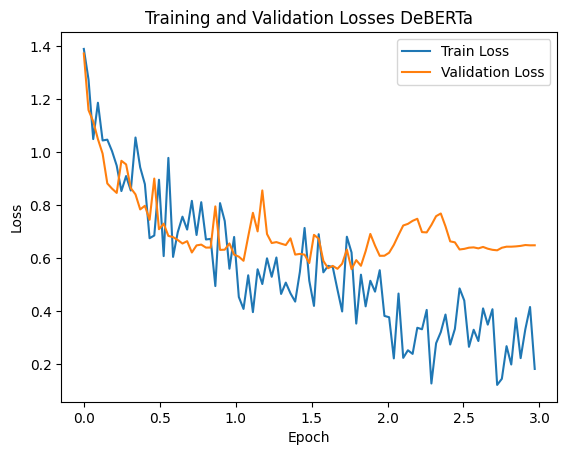

In [ ]:
import matplotlib.pyplot as plt

x = np.linspace(0, 3, num=98)
# Plotting
plt.plot(x, tr, label='Train Loss')
plt.plot(x, val, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Losses DeBERTa')
plt.legend()
plt.savefig('Deberta_losses.png')
plt.show()

## Testing

In [11]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [21]:
# THIS CODE IS FOR TESTING, NEED TEST SPLIT
import torch
from torch.utils.data import Dataset, DataLoader

# Define a custom dataset class for testing
class TestDataset(Dataset):
    def __init__(self, sentences, tokenizer, max_length):
        self.sentences = sentences
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.sentences)

    def __getitem__(self, idx):
        sentence = self.sentences[idx]
        inputs = self.tokenizer.encode_plus(
            sentence,
            add_special_tokens=True,
            max_length=self.max_length,
            padding='max_length',
            return_token_type_ids=True,
            return_attention_mask=True,
            truncation=True
        )
        return {
            'input_ids': torch.tensor(inputs['input_ids'], dtype=torch.long),
            'attention_mask': torch.tensor(inputs['attention_mask'], dtype=torch.long),
            'token_type_ids': torch.tensor(inputs['token_type_ids'], dtype=torch.long)
        }


# Define sentences for testing
test_sentences = [
    "This movie was fantastic!",
    "The acting was terrible, but the plot was good.",
    "I enjoyed the movie overall."
]

# Instantiate the test dataset
test_dataset = test_sentences
test_dataset = TestDataset(test_dataset, tokenizer, 512)

test_loader = DataLoader(test_dataset)

# Load the fine-tuned model
model = DebertaForSequenceClassification.from_pretrained('/content/drive/Shareddrives/DL_assignment2_2024/DeBERTa/DeBERTa-cp/972', num_labels=4)

sentences = []
predictions = []
# Perform inference on the test dataset
for batch in test_loader:
    input_ids = batch['input_ids']
    attention_mask = batch['attention_mask']
    token_type_ids = batch['token_type_ids']

    with torch.no_grad():
        outputs = model(input_ids, attention_mask=attention_mask, token_type_ids=token_type_ids)

    predicted_label = torch.argmax(outputs.logits, dim=1).item()
    sentences.append(tokenizer.decode(input_ids.squeeze().tolist(), skip_special_tokens=True))
    predictions.append(predicted_label)

In [ ]:
# THIS CODE IS FOR TESTING, NEED TEST SPLIT
import torch
from torch.utils.data import Dataset, DataLoader

# Define a custom dataset class for testing
class TestDataset(Dataset):
    def __init__(self, sentences, tokenizer, max_length):
        self.sentences = sentences
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.sentences)

    def __getitem__(self, idx):
        sentence = self.sentences[idx]
        inputs = self.tokenizer.encode_plus(
            sentence,
            add_special_tokens=True,
            max_length=self.max_length,
            padding='max_length',
            return_token_type_ids=True,
            return_attention_mask=True,
            truncation=True
        )
        return {
            'input_ids': torch.tensor(inputs['input_ids'], dtype=torch.long),
            'attention_mask': torch.tensor(inputs['attention_mask'], dtype=torch.long),
            'token_type_ids': torch.tensor(inputs['token_type_ids'], dtype=torch.long)
        }


# Define sentences for testing
test_sentences = [
    "This movie was fantastic!",
    "The acting was terrible, but the plot was good.",
    "I enjoyed the movie overall."
]

# Instantiate the test dataset
test_dataset = test_
test_dataset = TestDataset(test_dataset, tokenizer, 512)

test_loader = DataLoader(test_dataset)

# Load the fine-tuned model
model = DebertaForSequenceClassification.from_pretrained('/content/drive/Shareddrives/DL_assignment2_2024/DeBERTa/DeBERTa-cp/972', num_labels=4)

sentences = []
predictions = []
# Perform inference on the test dataset
for batch in test_loader:
    input_ids = batch['input_ids']
    attention_mask = batch['attention_mask']
    token_type_ids = batch['token_type_ids']

    with torch.no_grad():
        outputs = model(input_ids, attention_mask=attention_mask, token_type_ids=token_type_ids)

    predicted_label = torch.argmax(outputs.logits, dim=1).item()
    sentences.append(tokenizer.decode(input_ids.squeeze().tolist(), skip_special_tokens=True))
    predictions.append(predicted_label)

In [24]:
from sklearn.metrics import confusion_matrix
import array

pred_ = array.array('i', predictions)
true_ = array.array('i', test_labels)

#label_m = {0 : 'negative', 1 : 'neutral', 2 : 'positive', 3: 'conflict'}
#predicted_labels = [label_m[label_] for label_ in predictions]
# Compute the confusion matrix
cm = confusion_matrix(true_, pred_)

print("Confusion Matrix:")
print(cm)

ValueError: Found input variables with inconsistent numbers of samples: [558, 3]

In [ ]:
from sklearn.metrics import accuracy_score, f1_score

import numpy as np
from sklearn.metrics import accuracy_score, f1_score

def compute_metr(true_labels, predicted_labels):

    # Compute accuracy
    accuracy = accuracy_score(true_labels, predicted_labels)

    # Compute F1 score
    f1 = f1_score(true_labels, predicted_labels, average='weighted')

    return {
        'accuracy': accuracy,
        'f1': f1
    }

In [ ]:
compute_metr(test_labels, predicted_label)